In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
from numpy import linalg as la
from scipy.sparse import issparse
import loompy
import anndata
import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.4 (python 3.8.12) on 2024-07-11 16:21.


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white')

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.21.6 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.1 python-igraph==0.9.9 pynndescent==0.5.5


In [3]:
import os
os.chdir('D:/KP/EKP_RKP')

In [4]:
import scanpy.external as sce

In [5]:
adata = sc.read('Myeloid_cell.h5ad')
adata

AnnData object with n_obs × n_vars = 4380 × 16462
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'tissue_1', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt', 'n_counts', 'celltype'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'celltype_colors', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'leiden_rank_fgsea', 'neighbors', 'pca', 'tissue_1_colors', 'tissue_colors', 'type_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

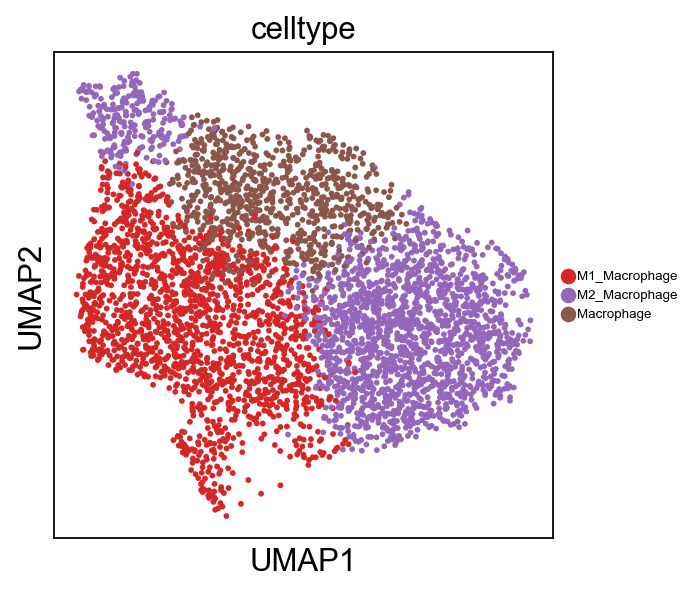

In [6]:
sc.pl.umap(adata, color=['celltype'], legend_loc='right margin', legend_fontsize=6)#, save='_Immune_cells_by_celltype.pdf')

In [94]:
#adata.raw = adata

In [8]:
adata.raw.X

<4380x16462 sparse matrix of type '<class 'numpy.float32'>'
	with 6828643 stored elements in Compressed Sparse Row format>

In [96]:
#sc.tl.pca(adata)
#sc.pp.neighbors(adata)

In [9]:
#sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
#sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
sc.tl.leiden(adata)
sc.tl.umap(adata)

computing PCA
    with n_comps=50
    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


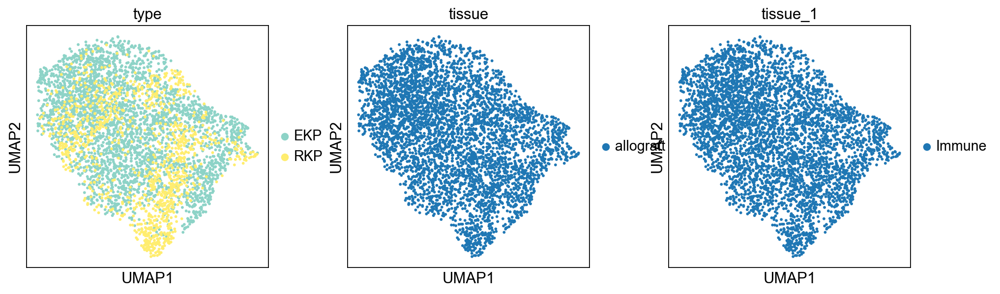

In [10]:
sc.pl.umap(adata, color=['type','tissue','tissue_1'])

In [11]:
adata_1 = adata

In [73]:
adata = adata_1

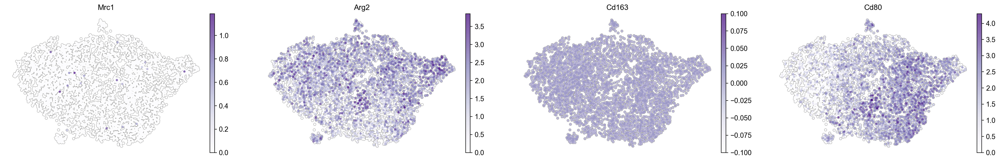

In [74]:
sc.pl.umap(adata_1, color=['Mrc1','Arg2','Cd163', 'Cd80'],legend_loc='right margin', frameon=False, vmin=0,add_outline=True, outline_width=(0.05,0.05), size=50,cmap='Purples',)

In [75]:
#############################################################
############ Harmony batch correction #######################
#############################################################

sce.pp.harmony_integrate(adata, 'batch')
'X_pca_harmony' in adata.obsm
True

2024-05-01 01:57:31,590 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-05-01 01:57:33,254 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-05-01 01:57:33,284 - harmonypy - INFO - Iteration 1 of 10
2024-05-01 01:57:34,229 - harmonypy - INFO - Iteration 2 of 10
2024-05-01 01:57:35,133 - harmonypy - INFO - Iteration 3 of 10
2024-05-01 01:57:36,061 - harmonypy - INFO - Iteration 4 of 10
2024-05-01 01:57:36,653 - harmonypy - INFO - Iteration 5 of 10
2024-05-01 01:57:37,054 - harmonypy - INFO - Iteration 6 of 10
2024-05-01 01:57:37,455 - harmonypy - INFO - Iteration 7 of 10
2024-05-01 01:57:37,848 - harmonypy - INFO - Converged after 7 iterations


True

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


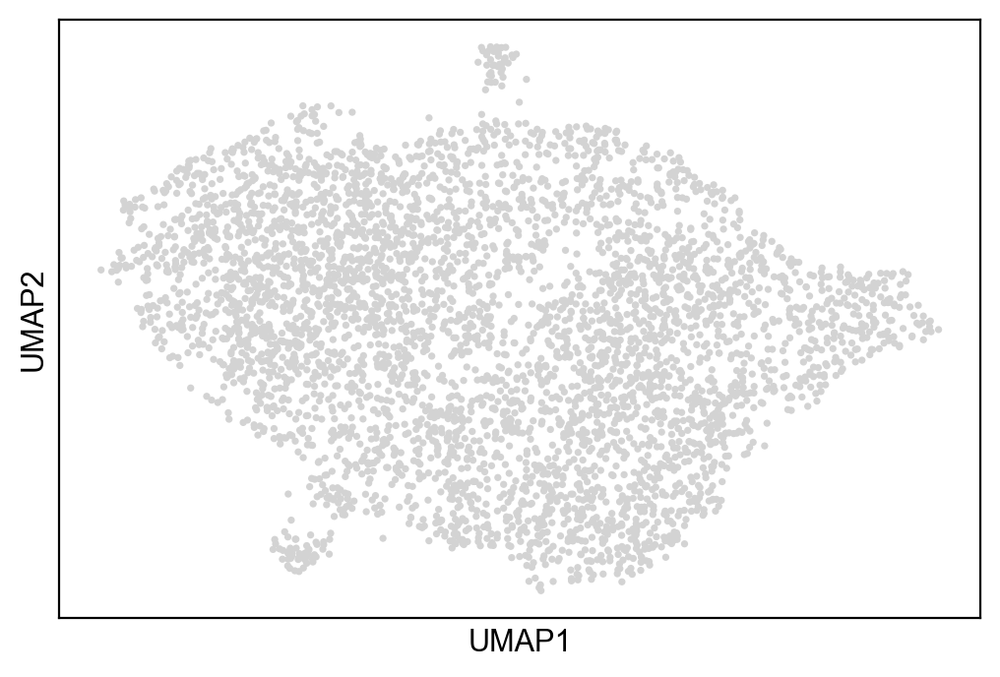

In [76]:
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.2)
sc.pl.umap(adata)

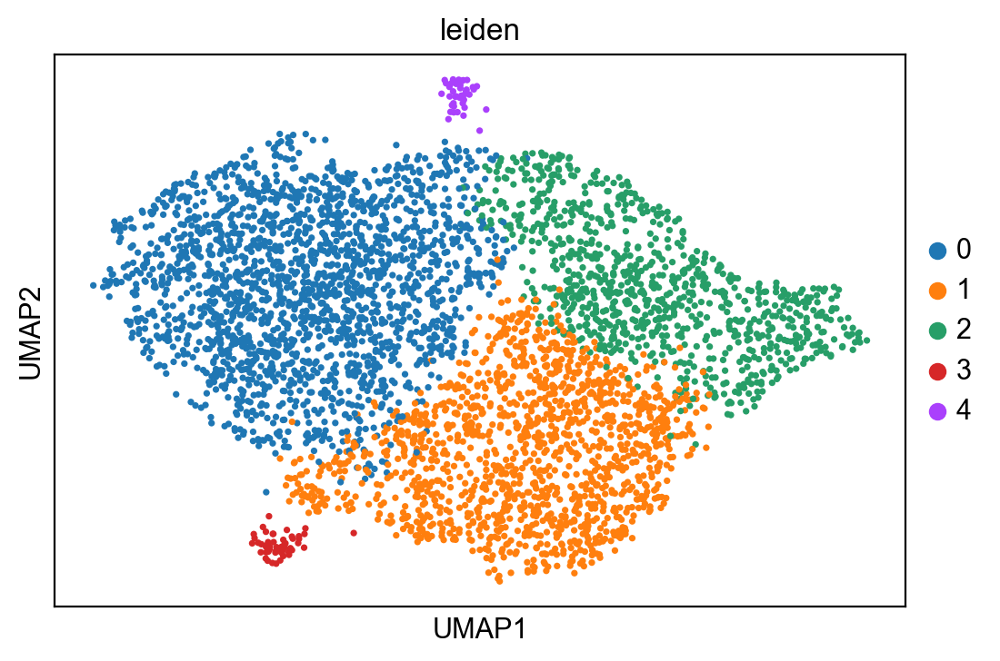

In [77]:
sc.pl.umap(adata, color=['leiden'])

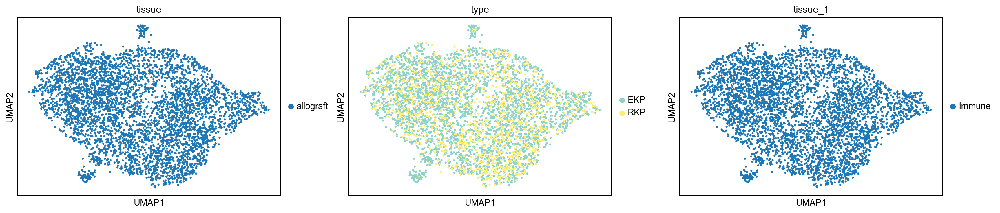

In [78]:
sc.pl.umap(adata, color=['tissue','type','tissue_1'])

In [79]:
df = pd.crosstab(adata.obs['leiden'], adata.obs['type'])
df

type,EKP,RKP
leiden,,
0,1520,458
1,911,478
2,673,249
3,49,2
4,37,3


# check

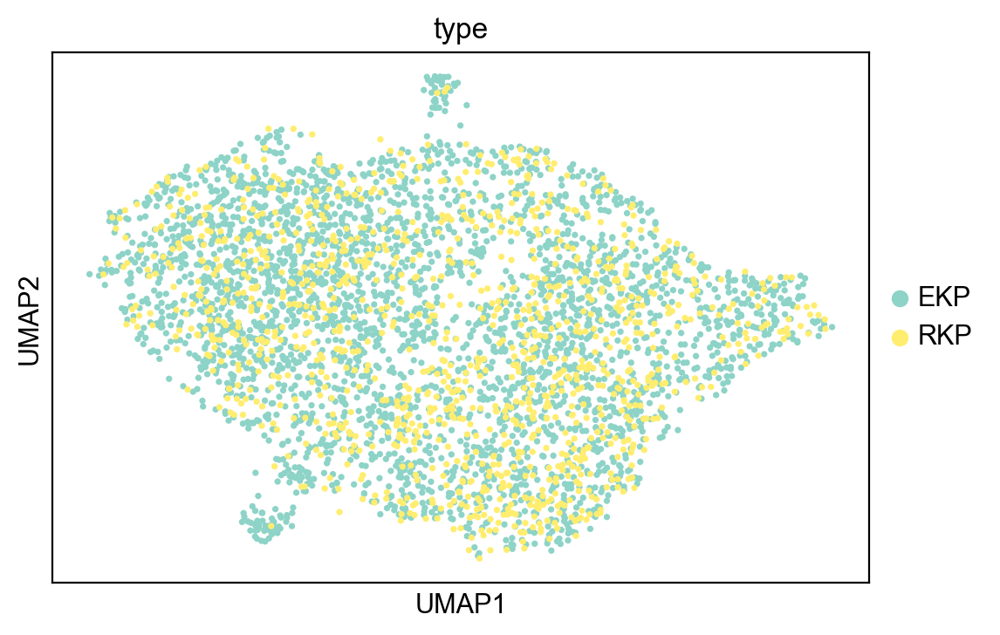

In [10]:
sc.pl.umap(adata, color=['type'],palette="Set3", save='_Myeloid_cell_by_type_modified.pdf')

In [81]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,type,leiden,batch,tissue_1,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt,n_counts,celltype
AAACCCACAACACACT-1-0,1224,1220,1482.800415,3.906282,0.263440,allograft,EKP,0,0,Immune,23.835543,1.607468,0.628129,0.042361,0.002634,1482.800415,M2_Macrophage
AAACCCACAGACTCTA-1-0,1280,1278,1615.358765,12.976051,0.803292,allograft,EKP,0,0,Immune,71.692551,4.438181,0.000000,0.000000,0.008033,1615.358765,M2_Macrophage
AAACGAACACAACGTT-1-0,1853,1852,1831.287720,20.704004,1.130571,allograft,EKP,2,0,Immune,73.607811,4.019456,2.079207,0.113538,0.011306,1831.287720,Macrophage
AAACGAACAGACGATG-1-0,1839,1838,1929.874512,0.728869,0.037768,allograft,EKP,1,0,Immune,74.001747,3.834537,0.000000,0.000000,0.000378,1929.874512,M1_Macrophage
AAACGAAGTTTGGGTT-1-0,1438,1437,1834.701172,11.139084,0.607133,allograft,EKP,0,0,Immune,104.808022,5.712539,0.000000,0.000000,0.006071,1834.701172,M2_Macrophage
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCCTCTCACAGAGG-1-1,2595,2592,2453.814941,24.509863,0.998847,allograft,RKP,0,1,Immune,175.833878,7.165735,1.767705,0.072039,0.009988,2453.814941,M2_Macrophage
TTTGACTAGATCGGTG-1-1,2571,2569,2239.192627,22.420515,1.001277,allograft,RKP,1,1,Immune,137.132645,6.124200,1.049196,0.046856,0.010013,2239.192627,M1_Macrophage
TTTGACTGTTGTGGAG-1-1,1243,1243,1468.334351,26.262447,1.788588,allograft,RKP,1,1,Immune,57.621696,3.924290,0.733939,0.049984,0.017886,1468.334351,M1_Macrophage
TTTGATCGTGCGTGCT-1-1,1629,1628,1980.749756,13.624981,0.687870,allograft,RKP,2,1,Immune,92.942139,4.692271,1.662777,0.083947,0.006879,1980.749756,Macrophage


In [8]:
scv.set_figure_params(style='scvelo', dpi=100, dpi_save=300, frameon=None)

saving figure to file ./figures/scvelo__Myeloid_scatterplot_by_type.pdf


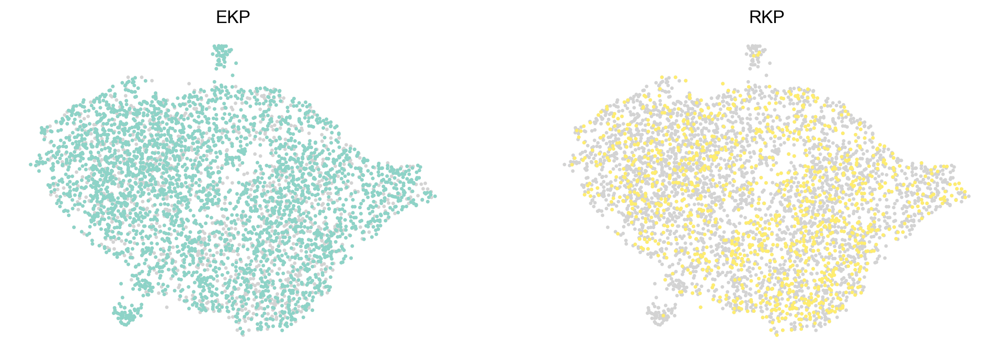

In [9]:
scv.pl.scatter(adata, groups=[[c] for c in adata.obs['type'].cat.categories], color='type', ncols=4, save="_Myeloid_scatterplot_by_type.pdf")

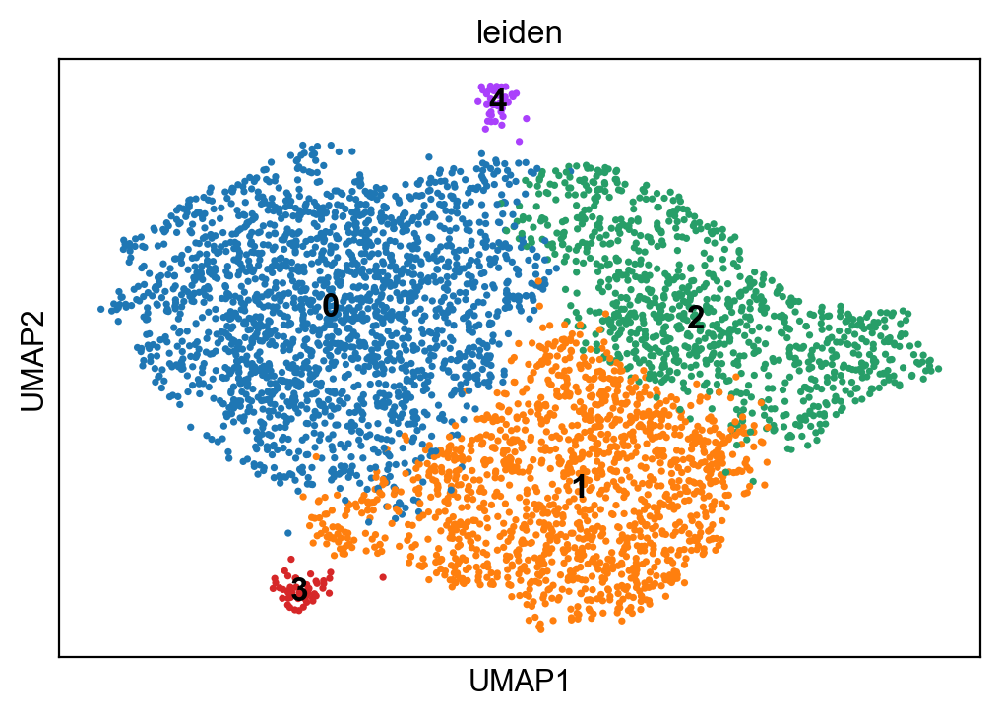

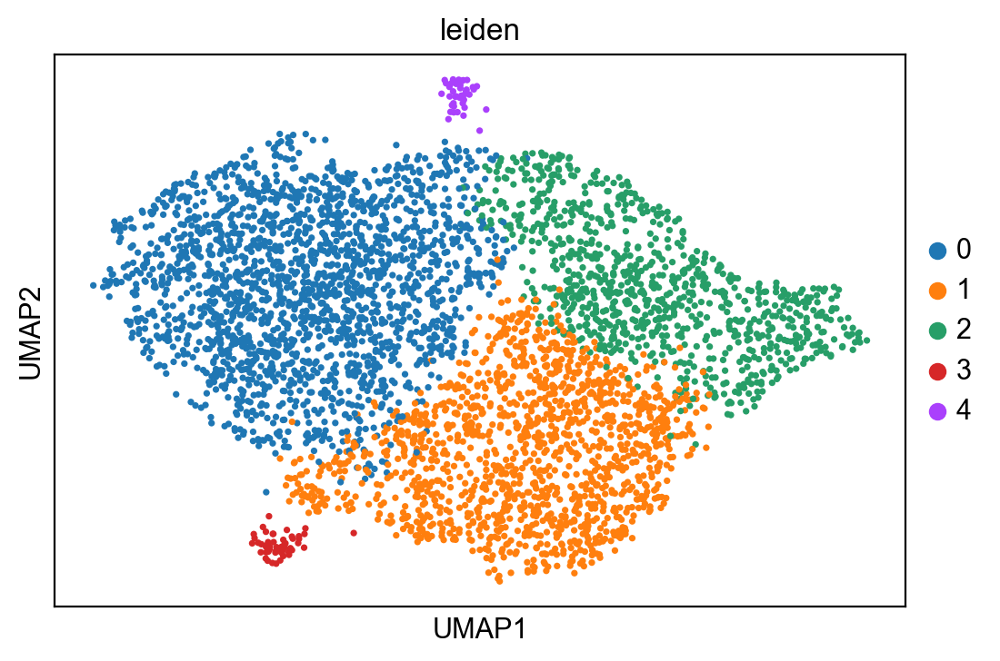

In [84]:
sc.pl.umap(adata, color=['leiden'],legend_loc='on data')#, save='_Immune_Normal8_NAC15_Tumor15_by_leiden.pdf')
sc.pl.umap(adata, color=['leiden'],legend_loc='right margin')#, save='_Immune_Normal8_NAC15_Tumor15_by_leiden_1.pdf')

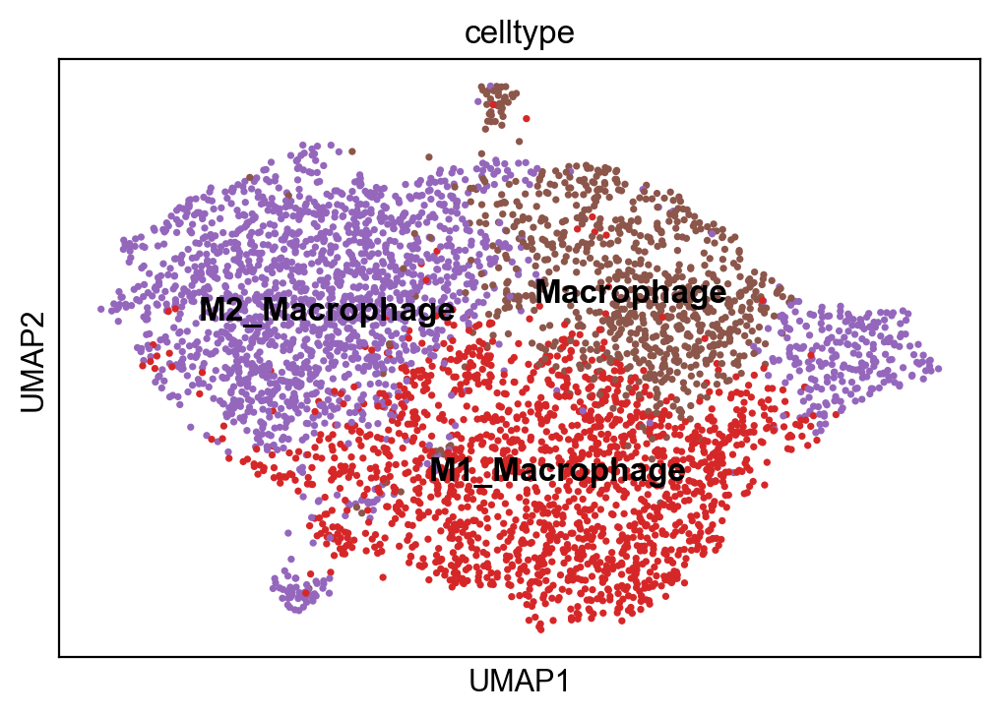

In [11]:
sc.pl.umap(adata, color=['celltype'],legend_loc='on data')#, save='_Immune_Normal8_NAC15_Tumor15_by_leiden.pdf')

In [12]:
df = pd.crosstab(adata.obs['celltype'], adata.obs['type'])
df

type,EKP,RKP
celltype,,
M1_Macrophage,1091,556
M2_Macrophage,1517,400
Macrophage,582,234


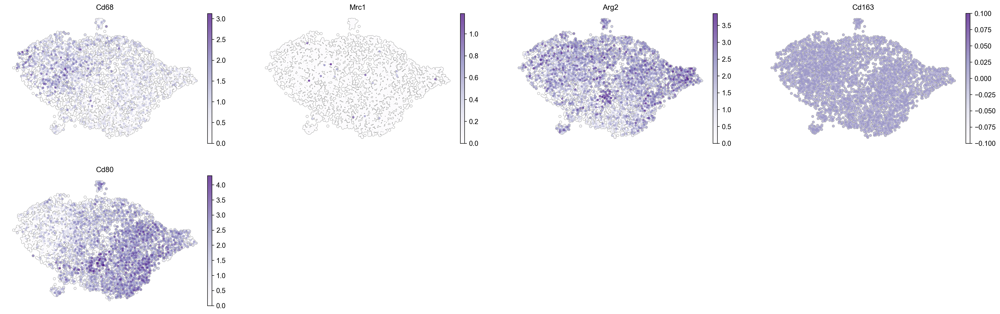

In [85]:
sc.pl.umap(adata, color=['Cd68','Mrc1','Arg2','Cd163', 'Cd80'],legend_loc='right margin', frameon=False, vmin=0,add_outline=True, outline_width=(0.05,0.05), size=50,cmap='Purples',)

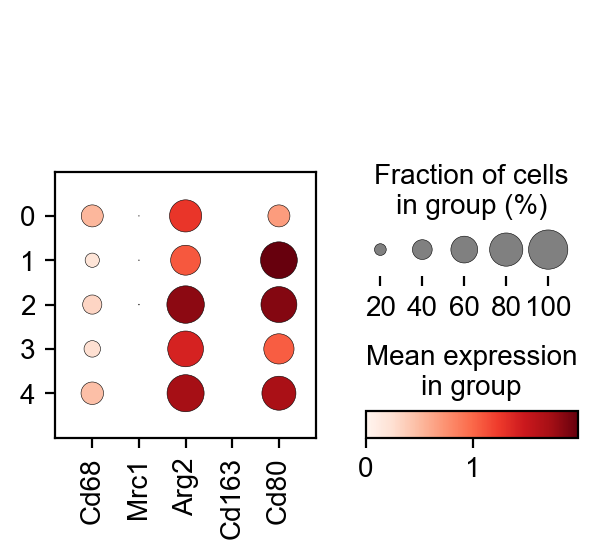

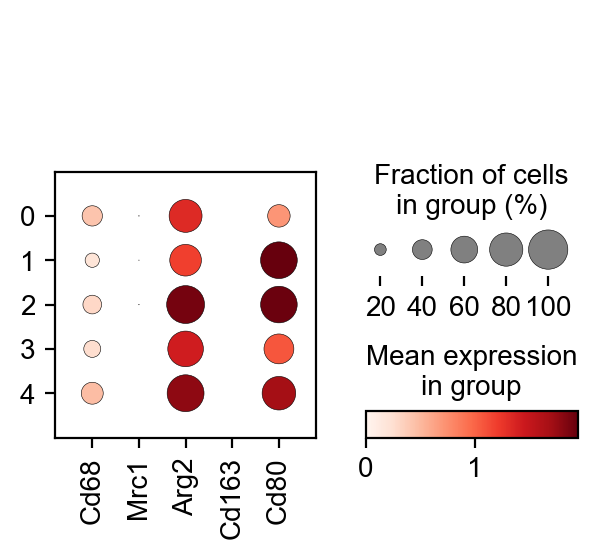

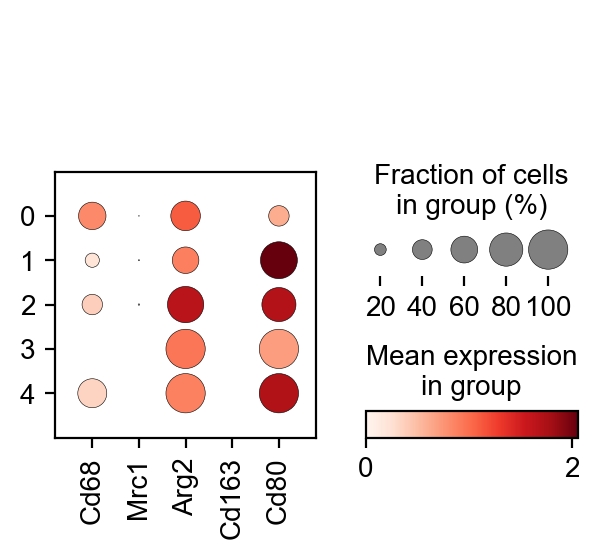

In [86]:
sc.pl.dotplot(adata, ['Cd68','Mrc1','Arg2','Cd163', 'Cd80'], groupby='leiden')
sc.pl.dotplot(adata[adata.obs['type']=='EKP'], ['Cd68','Mrc1','Arg2','Cd163', 'Cd80'], groupby='leiden')
sc.pl.dotplot(adata[adata.obs['type']=='RKP'], ['Cd68','Mrc1','Arg2','Cd163', 'Cd80'], groupby='leiden')

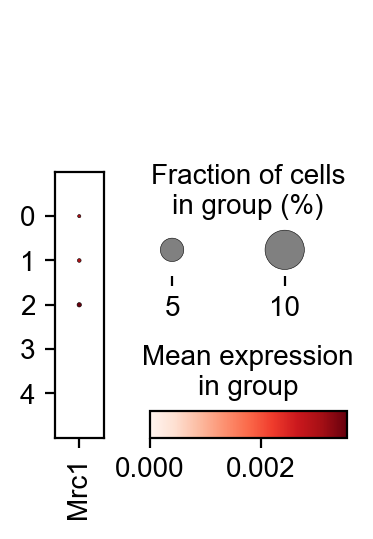

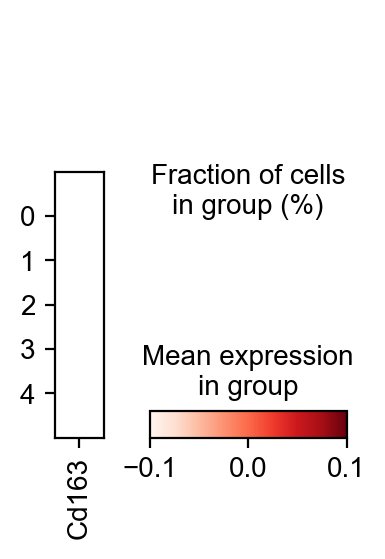

In [87]:
sc.pl.dotplot(adata, ['Mrc1'], groupby='leiden')
sc.pl.dotplot(adata, ['Cd163'], groupby='leiden')

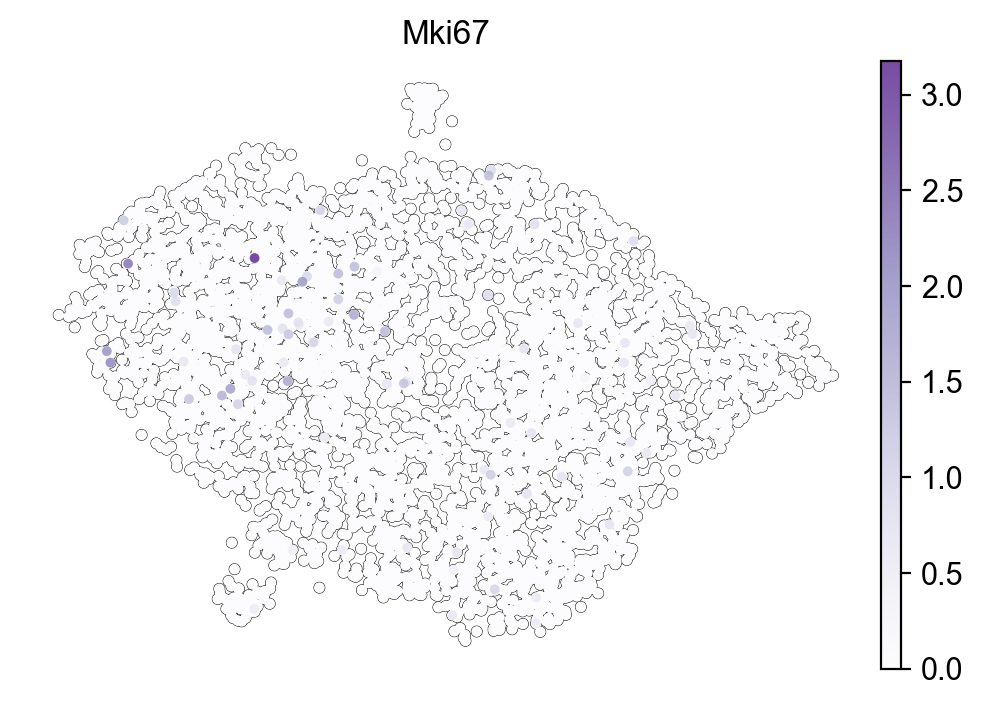

In [88]:
sc.pl.umap(adata, color=['Mki67'],legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50,cmap='Purples',)

In [89]:
adata.write('Myeloidcell_isolated_04-30-24.h5ad', compression='gzip')

In [5]:
adata =sc.read('Myeloidcell_isolated_04-30-24.h5ad')
adata

AnnData object with n_obs × n_vars = 4380 × 16462
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'tissue_1', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt', 'n_counts', 'celltype'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'celltype_colors', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'leiden_rank_fgsea', 'neighbors', 'pca', 'tissue_1_colors', 'tissue_colors', 'type_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,type,leiden,batch,tissue_1,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt,n_counts,celltype
AAACCCACAACACACT-1-0,1224,1220,1482.800415,3.906282,0.263440,allograft,EKP,0,0,Immune,23.835543,1.607468,0.628129,0.042361,0.002634,1482.800415,M2_Macrophage
AAACCCACAGACTCTA-1-0,1280,1278,1615.358765,12.976051,0.803292,allograft,EKP,0,0,Immune,71.692551,4.438181,0.000000,0.000000,0.008033,1615.358765,M2_Macrophage
AAACGAACACAACGTT-1-0,1853,1852,1831.287720,20.704004,1.130571,allograft,EKP,2,0,Immune,73.607811,4.019456,2.079207,0.113538,0.011306,1831.287720,Macrophage
AAACGAACAGACGATG-1-0,1839,1838,1929.874512,0.728869,0.037768,allograft,EKP,1,0,Immune,74.001747,3.834537,0.000000,0.000000,0.000378,1929.874512,M1_Macrophage
AAACGAAGTTTGGGTT-1-0,1438,1437,1834.701172,11.139084,0.607133,allograft,EKP,0,0,Immune,104.808022,5.712539,0.000000,0.000000,0.006071,1834.701172,M2_Macrophage
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCCTCTCACAGAGG-1-1,2595,2592,2453.814941,24.509863,0.998847,allograft,RKP,0,1,Immune,175.833878,7.165735,1.767705,0.072039,0.009988,2453.814941,M2_Macrophage
TTTGACTAGATCGGTG-1-1,2571,2569,2239.192627,22.420515,1.001277,allograft,RKP,1,1,Immune,137.132645,6.124200,1.049196,0.046856,0.010013,2239.192627,M1_Macrophage
TTTGACTGTTGTGGAG-1-1,1243,1243,1468.334351,26.262447,1.788588,allograft,RKP,1,1,Immune,57.621696,3.924290,0.733939,0.049984,0.017886,1468.334351,M1_Macrophage
TTTGATCGTGCGTGCT-1-1,1629,1628,1980.749756,13.624981,0.687870,allograft,RKP,2,1,Immune,92.942139,4.692271,1.662777,0.083947,0.006879,1980.749756,Macrophage


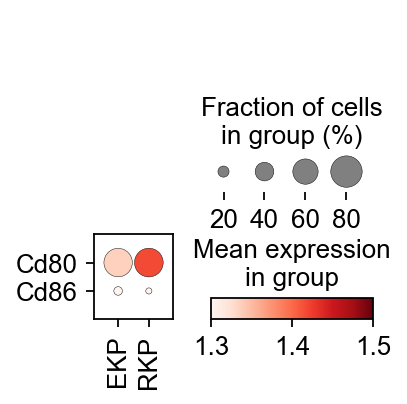

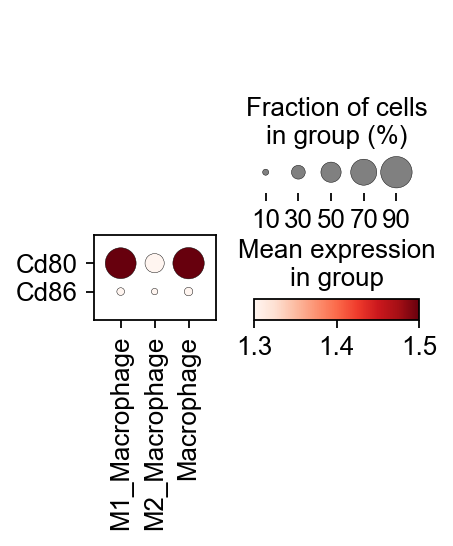

In [16]:
ctla_geneset = ['Cd80','Cd86'] # exhausted T cell
sc.pl.dotplot(adata, ctla_geneset, groupby='type',vmin=1.3, vmax=1.5,  swap_axes=True)#, save='_T_cell_exT_markers_by_genotype.pdf')
sc.pl.dotplot(adata, ctla_geneset, groupby='celltype',vmin=1.3, vmax=1.5,  swap_axes=True)#, save='_T_cell_exT_markers_by_genotype.pdf')

In [10]:
sc.tl.rank_genes_groups(adata, 'type', method='t-test')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [11]:
result_T_ekprkp = adata.uns['rank_genes_groups']
groups_T_ekprkp = result_T_ekprkp['names'].dtype.names
pval_table_T_ekprkp = pd.DataFrame(
            {group + '_' + key[:2]: result_T_ekprkp[key][group]
            for group in groups_T_ekprkp for key in ['names', 'pvals_adj']})
pval_table_T_ekprkp

,EKP_na,EKP_pv,RKP_na,RKP_pv
0,Plin2,4.728065e-59,Gm42418,0.000000e+00
1,Cxcl3,2.951424e-57,Cmss1,0.000000e+00
2,Bnip3,3.461520e-47,Gphn,0.000000e+00
3,Thbs1,4.024197e-45,Cdk8,2.551435e-269
4,Ero1l,1.174014e-43,AY036118,3.742796e-229
...,...,...,...,...
16457,AY036118,3.742796e-229,Ero1l,1.174014e-43
16458,Cdk8,2.551435e-269,Thbs1,4.024197e-45
16459,Gphn,0.000000e+00,Bnip3,3.461520e-47
16460,Cmss1,0.000000e+00,Cxcl3,2.951424e-57


In [14]:
pval_table_T_ekprkp.loc[pval_table_T_ekprkp['RKP_na'].isin(['Cd86','Cd80'])]

,EKP_na,EKP_pv,RKP_na,RKP_pv
3349,Clip4,5.083064e-01,Cd80,0.11664
15875,Rdh5,3.436898e-07,Cd86,0.00131


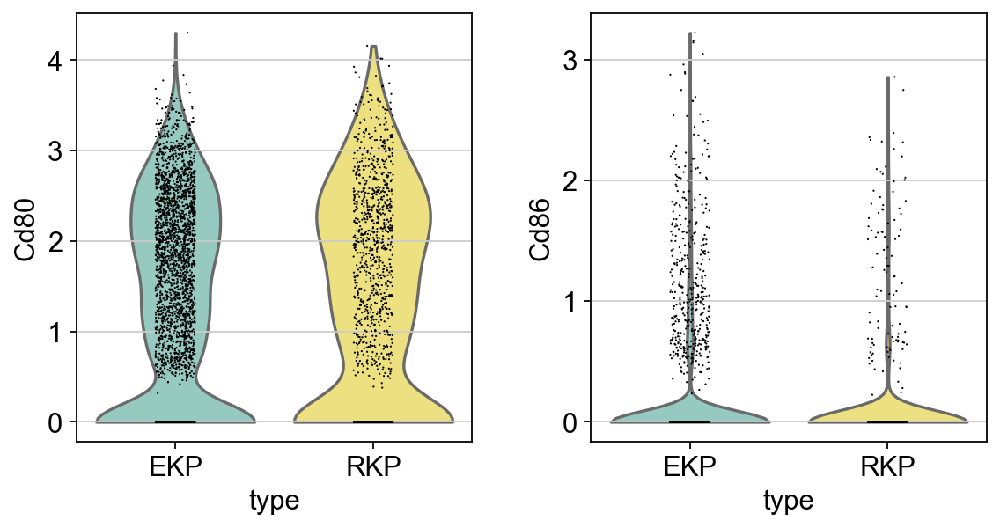

In [13]:
sc.pl.violin(adata, ctla_geneset, groupby='type', swap_axes=False)#, save='_Tcell_Ctla4,Pdcd1,Lag3,Havcr2_by_genotype.pdf')

In [15]:
adata.obs['celltype']

AAACCCACAACACACT-1-0    M2_Macrophage
AAACCCACAGACTCTA-1-0    M2_Macrophage
AAACGAACACAACGTT-1-0       Macrophage
AAACGAACAGACGATG-1-0    M1_Macrophage
AAACGAAGTTTGGGTT-1-0    M2_Macrophage
                            ...      
TTTCCTCTCACAGAGG-1-1    M2_Macrophage
TTTGACTAGATCGGTG-1-1    M1_Macrophage
TTTGACTGTTGTGGAG-1-1    M1_Macrophage
TTTGATCGTGCGTGCT-1-1       Macrophage
TTTGGAGTCTATCCAT-1-1    M1_Macrophage
Name: celltype, Length: 4380, dtype: category
Categories (3, object): ['M1_Macrophage', 'M2_Macrophage', 'Macrophage']

In [17]:
adata_apc = adata[adata.obs['celltype']=="Macrophage"]
adata_apc

View of AnnData object with n_obs × n_vars = 816 × 16462
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'tissue_1', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt', 'n_counts', 'celltype'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'celltype_colors', 'dendrogram_leiden', 'leiden', 'leiden_rank_fgsea', 'neighbors', 'pca', 'tissue_1_colors', 'tissue_colors', 'type_colors', 'umap', 'rank_genes_groups'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

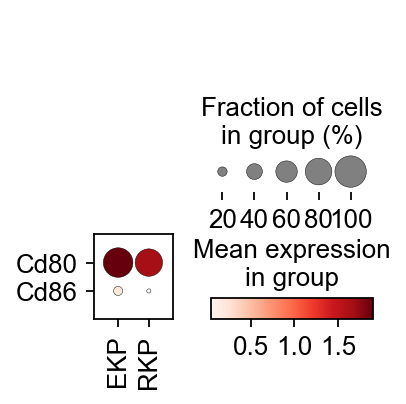

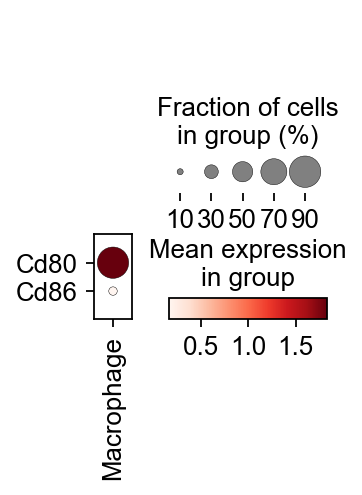

In [20]:
sc.pl.dotplot(adata_apc, ctla_geneset, groupby='type',  swap_axes=True)#, save='_T_cell_exT_markers_by_genotype.pdf')
sc.pl.dotplot(adata_apc, ctla_geneset, groupby='celltype',  swap_axes=True)#, save='_T_cell_exT_markers_by_genotype.pdf')

In [91]:
#for fGSEA
sc.tl.rank_genes_groups(adata, groupby='type', method='wilcoxon', use_raw=True,  key_added = "EKP_RKP_Myeloid_rank_fgsea")
result = adata.uns['EKP_RKP_Myeloid_rank_fgsea']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores','logfoldchanges', 'pvals', 'pvals_adj']}).to_csv("D:/KP/EKP_RKP/EKP_RKP_Myeloid_fgsea.csv")
# logFC becomes negative or disappear when use_raw=False, could be Scanpy bug


ranking genes
    finished: added to `.uns['EKP_RKP_Myeloid_rank_fgsea']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


In [7]:
#for fGSEA
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon', use_raw=True,  key_added = "Leiden_Myeloid_rank_fgsea")
result = adata.uns['Leiden_Myeloid_rank_fgsea']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores','logfoldchanges', 'pvals', 'pvals_adj']}).to_csv("D:/KP/EKP_RKP/Leiden_Myeloid_rank_fgsea.csv")
# logFC becomes negative or disappear when use_raw=False, could be Scanpy bug


ranking genes
    finished: added to `.uns['Leiden_Myeloid_rank_fgsea']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)
